In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
from glob import glob
import seaborn as sns
from skimage.io import imread
import random
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from PIL import Image
%matplotlib inline

In [2]:
skin_df = pd.read_csv('skin_df.csv')

In [3]:
skin_df.head()

,Unnamed: 0,lesion_id,image_id,dx,dx_type,age,sex,localization,path,cell_type,Malignant,cell_type_idx
0,0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp,D:\dataset\orig\ISIC_0027419.jpg,Benign_keratosis-like_lesions,0,2
1,1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp,D:\dataset\orig\ISIC_0025030.jpg,Benign_keratosis-like_lesions,0,2
2,2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp,D:\dataset\orig\ISIC_0026769.jpg,Benign_keratosis-like_lesions,0,2
3,3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp,D:\dataset\orig\ISIC_0025661.jpg,Benign_keratosis-like_lesions,0,2
4,4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear,D:\dataset\orig\ISIC_0031633.jpg,Benign_keratosis-like_lesions,0,2


In [4]:
print(f'shape of our dataset is {skin_df.shape}')

shape of our dataset is (10015, 12)


In [5]:
skin_df["image"] = skin_df["path"].map(imread) 

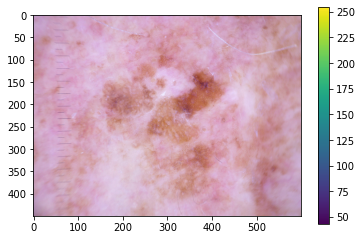

In [35]:
plt.figure()
plt.imshow(skin_df["image"][0])
plt.colorbar()
plt.grid(False)
plt.show()

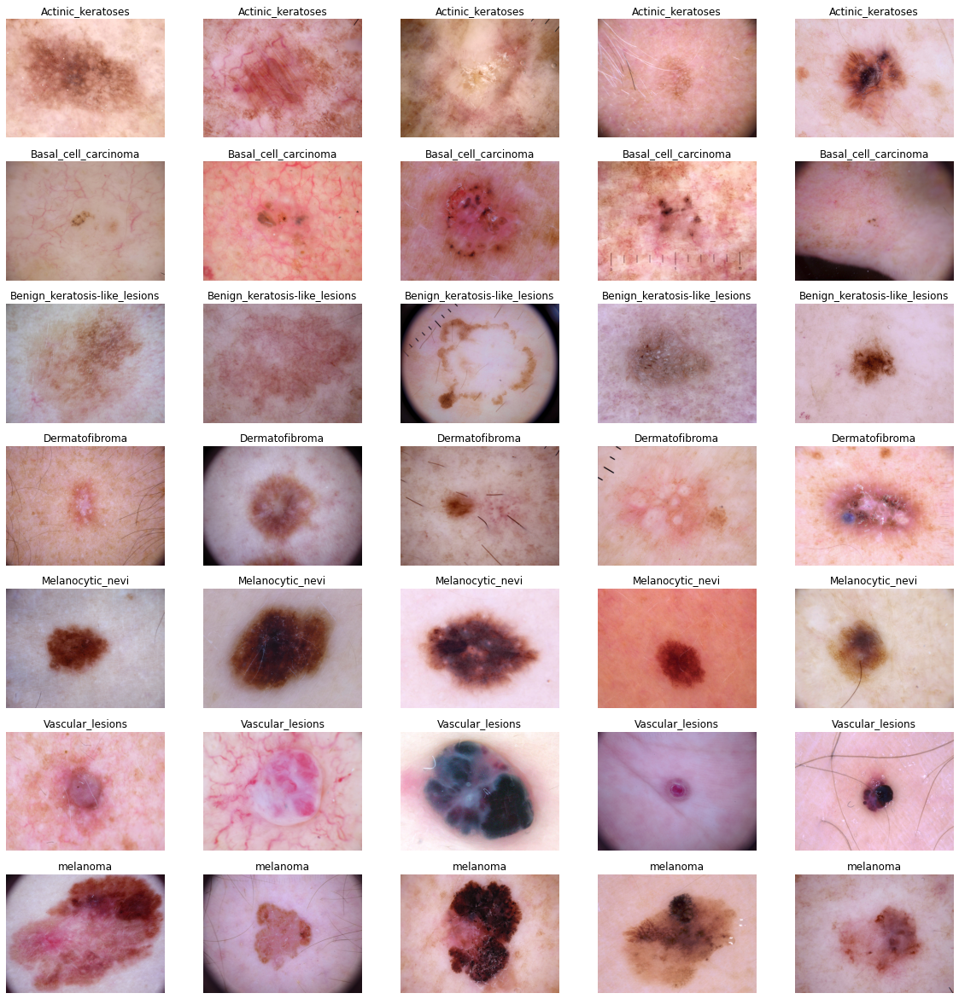

In [36]:
n_samples = 5 
fig, m_axs = plt.subplots(7, n_samples, figsize=(4*n_samples, 3 * 7))

for n_axs, (type_name, type_rows) in zip(m_axs, skin_df.sort_values(["cell_type"]).groupby("cell_type")):
    n_axs[0].set_title(type_name)
    for c_ax, (_, c_row) in zip(n_axs, type_rows.sample(n_samples, random_state=0).iterrows()):
        
        c_ax.set_title(type_name)
        c_ax.imshow(c_row["image"])
        c_ax.axis("off")

Based on these images, it is still very hard for non-experts to know which is which.

In [37]:
# create a pandas dataframe to store mean value of Red, Blue and Green for each picture
rgb_info_df = skin_df.apply(lambda x: pd.Series({'{}_mean'.format(k): v for k, v 
                                                 in zip(["Red", "Blue", "Green"], 
                                                        np.mean(x["image"], (0, 1)))}), 1)


gray_col_vec = rgb_info_df.apply(lambda x: np.mean(x), 1)
for c_col in rgb_info_df.columns:
    rgb_info_df[c_col] = rgb_info_df[c_col]/gray_col_vec 
rgb_info_df["Gray_mean"] = gray_col_vec
rgb_info_df.sample(3)

,Red_mean,Blue_mean,Green_mean,Gray_mean
317,1.110659,0.938697,0.950644,145.562190
3963,1.414326,0.813096,0.772578,150.718856
6870,1.128373,0.906985,0.964642,161.504307


In [38]:
for c_col in rgb_info_df.columns:
    skin_df[c_col] = rgb_info_df[c_col].values

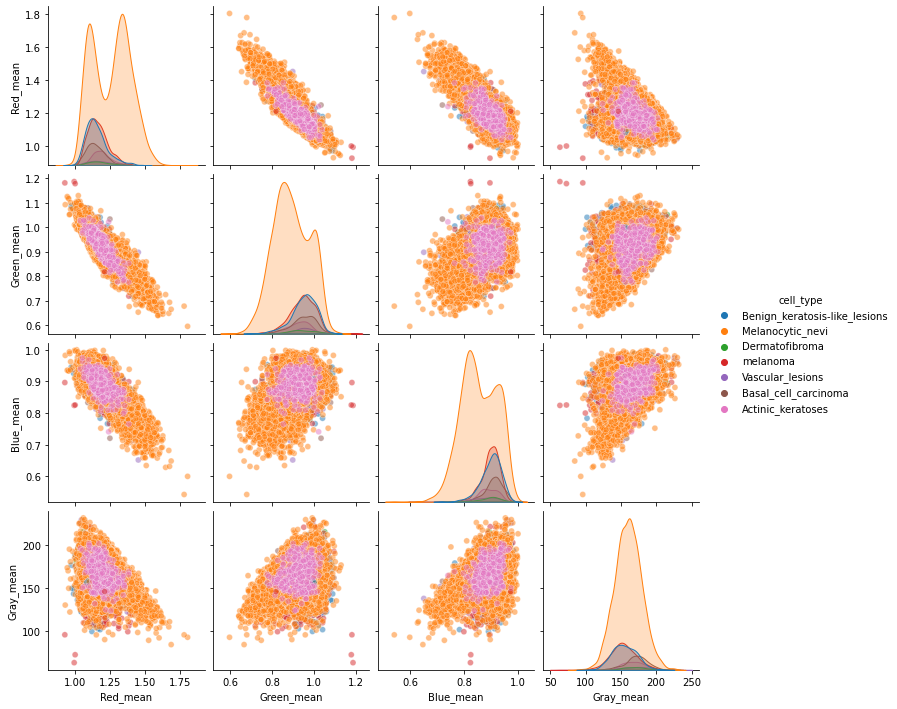

In [39]:
# let's draw a plot showing the distribution of different cell types over colors!
sns.pairplot(skin_df[["Red_mean", "Green_mean", "Blue_mean", "Gray_mean", "cell_type"]], 
             hue="cell_type", plot_kws = {"alpha": 0.5})

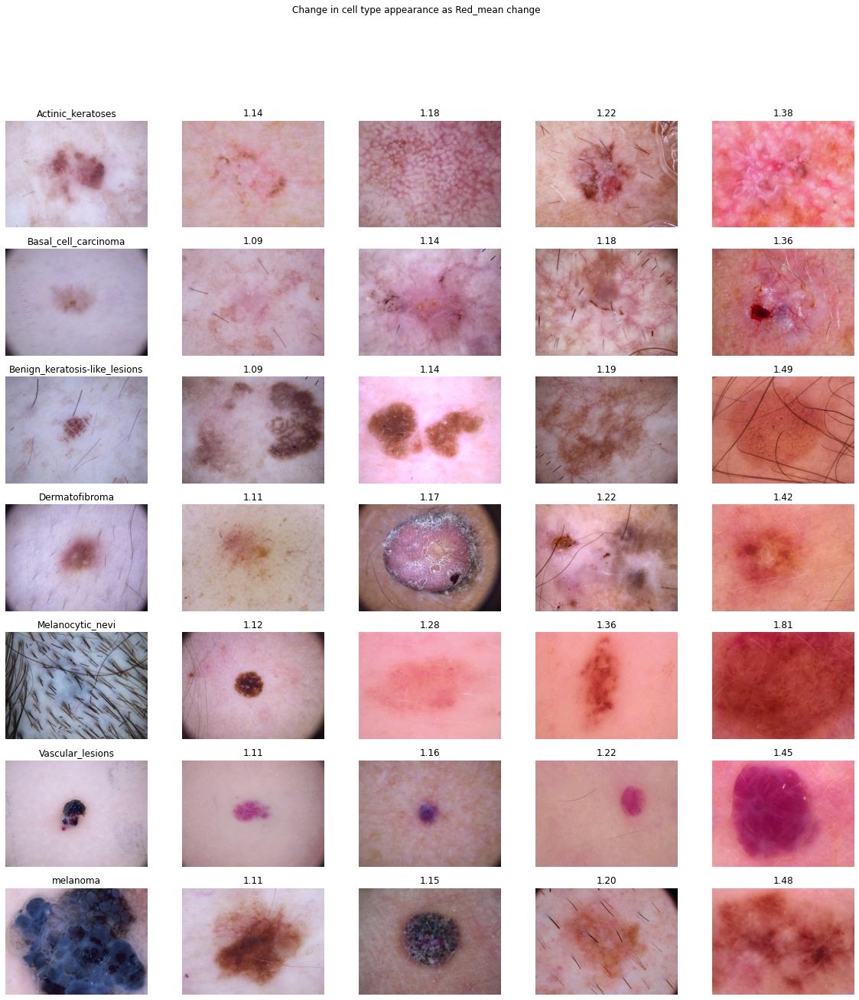

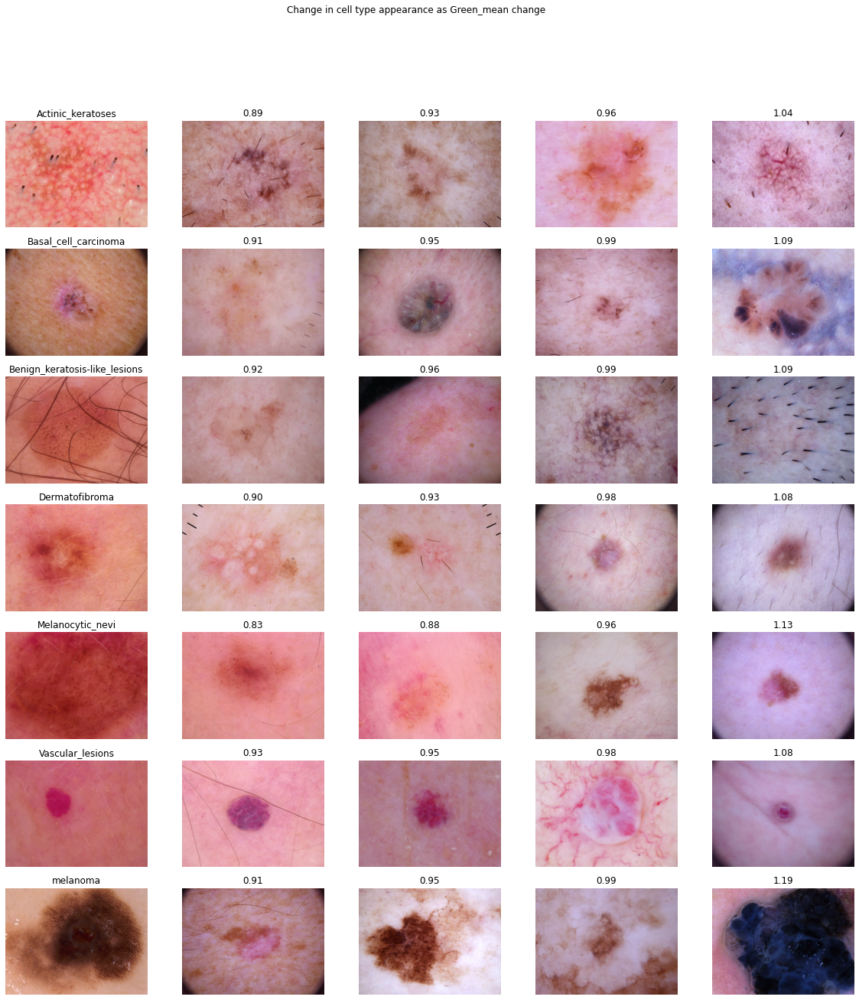

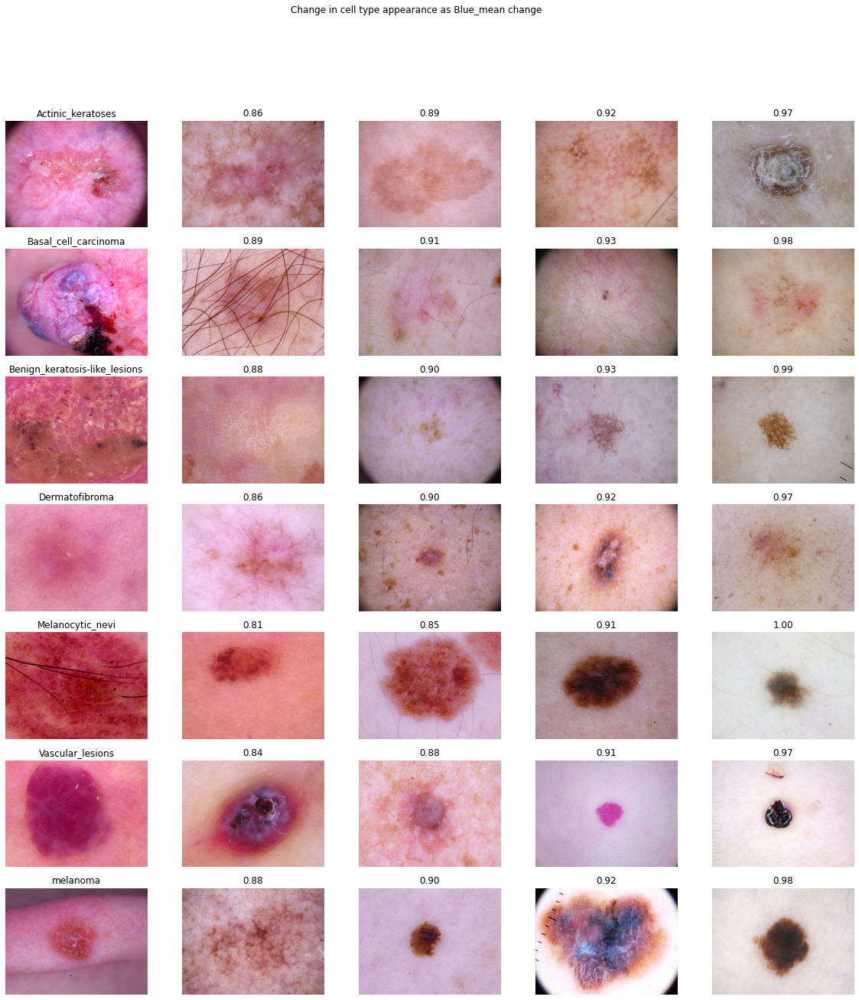

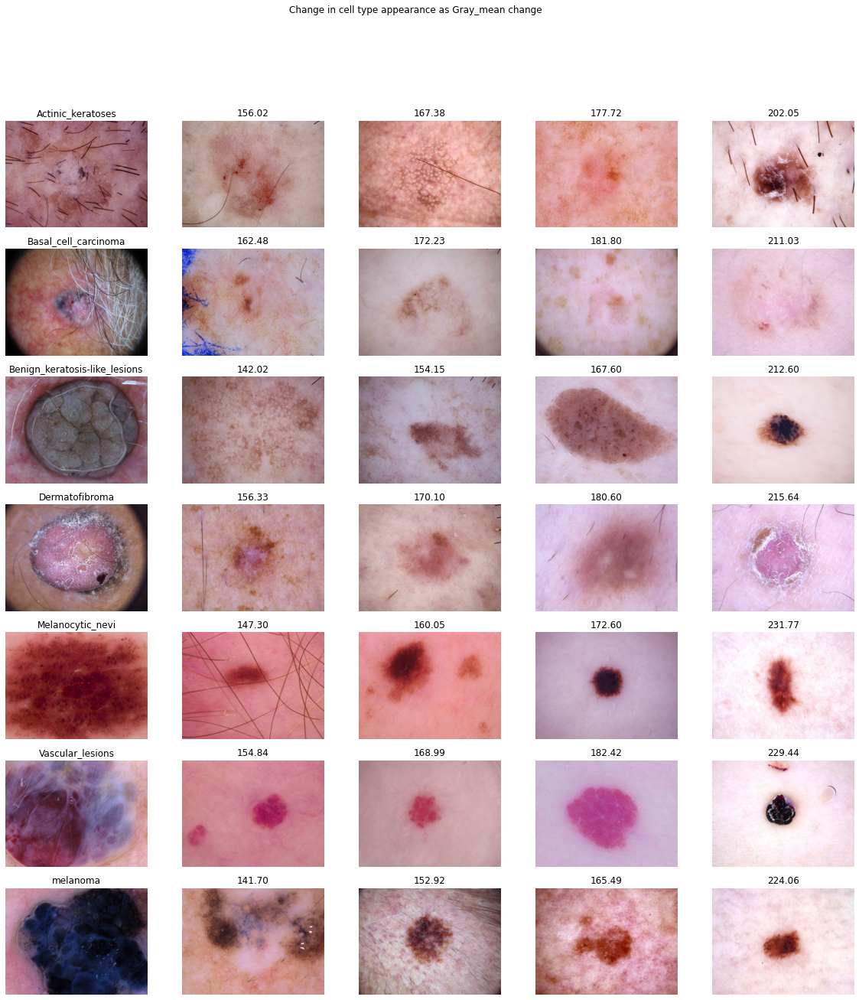

In [40]:
    # define a function to get back a dataframe with 5 samples sorted by color channel values 
n_samples = 5
for sample_col in ["Red_mean", "Green_mean", "Blue_mean", "Gray_mean"]:
    fig, m_axs = plt.subplots(7, n_samples, figsize=(4 * n_samples, 3 * 7))
    fig.suptitle(f"Change in cell type appearance as {sample_col} change")
    def take_n_space(in_rows, val_col, n):
        s_rows = in_rows.sort_values([val_col])
        s_idx = np.linspace(0, s_rows.shape[0] - 1, n, dtype=int)
        return s_rows.iloc[s_idx]
    
    for n_axs, (type_name, type_rows) in zip(m_axs, skin_df.sort_values(["cell_type"]).groupby("cell_type")):
        for c_ax, (_, c_row) in zip(n_axs, take_n_space(type_rows, sample_col, n_samples).iterrows()):
            c_ax.imshow(c_row["image"])
            c_ax.axis("off")
            c_ax.set_title('{:2.2f}'.format(c_row[sample_col]))
        n_axs[0].set_title(type_name)
    fig.savefig("{}_samples.png".format(sample_col), dpi=300)

In [6]:
reshaped_image = skin_df["path"].map(lambda x: np.asarray(Image.open(x).resize((128,128), resample=Image.LANCZOS).\
                                                          convert("RGB")).ravel())

In [7]:
out_vec = np.stack(reshaped_image, 0)

In [8]:
out_df = pd.DataFrame(out_vec)

In [9]:
out_df.head()

,0,1,2,3,4,5,6,7,8,9,...,49142,49143,49144,49145,49146,49147,49148,49149,49150,49151
0,189,153,194,193,156,199,191,155,197,191,...,185,187,159,188,185,156,183,178,147,163
1,24,13,22,24,14,22,25,14,26,25,...,30,27,15,28,25,14,24,23,13,22
2,187,127,136,190,134,146,194,136,152,196,...,127,138,106,109,118,81,82,104,64,65
3,24,11,17,24,11,19,28,15,25,38,...,15,25,12,17,24,11,15,22,8,12
4,129,87,109,141,96,119,151,106,129,160,...,96,94,63,79,71,43,59,49,24,38


In [10]:
out_vec = np.stack(reshaped_image, 0)

In [11]:
out_vec.shape

(10015, 49152)

In [12]:
out_vec = out_vec.astype("float32")
out_vec /= 255

In [13]:
labels = skin_df["cell_type_idx"].values

In [14]:
X_mean = np.mean(out_vec)
X_std = np.std(out_vec)

out_vec = (out_vec - X_mean)/X_std

In [20]:
sample = out_vec[0].reshape(128,128,3)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


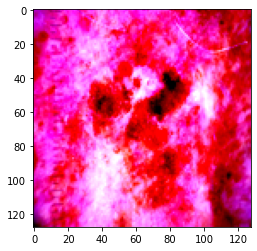

In [19]:
plt.imshow(sample)

In [51]:
X_train_orig, X_test, y_train_orig, y_test = train_test_split(out_vec, labels, test_size=0.1,random_state=0)

In [52]:
np.save("128_128_test.npy", X_test)
np.save("test_labels.npy", y_test)

In [53]:
X_train, X_val, y_train, y_val = train_test_split(X_train_orig, y_train_orig, test_size=0.1, random_state=1)

In [54]:
np.save("128_128_val.npy", X_val)
np.save("val_labels.npy", y_val)

In [55]:
np.save("128_128_train.npy", X_train)
np.save("train_labels.npy", y_train)